In [1]:
#!pip install --pre timm -U -q

In [2]:
#!pip install torch==1.12

In [3]:
# import timm
import torch
import numpy as np
import os, sys, shutil
import re
import transformers
import requests
from PIL import Image
from pathlib import Path
from scipy.io import loadmat
from torch.utils.data import Dataset, DataLoader
from tqdm.auto import tqdm
import sklearn.decomposition
import sklearn.cluster
import scipy.spatial
import umap
from sklearn.neighbors import KDTree

device = 'cpu'

In [4]:
import torchvision
from matplotlib import pyplot as plt

def show_tensor(tensor, transpose=None, normalize=None, figsize=(10,10), nrow=None, padding=2, verbose=True, **kwargs):
    '''Flexible tool for visulizing tensors of any shape. Support batch_size >= 1.'''
    if not isinstance(tensor, torch.Tensor):
        tensor = torch.tensor(np.array(tensor))
    tensor = tensor.detach().cpu().float()
    
    if tensor.ndim == 4 and tensor.shape[1] == 1:
        if verbose: print('processing as black&white')
        tensor = tensor.repeat(1,3,1,1)
    elif tensor.ndim == 3:
        tensor = tensor.unsqueeze(0)
    elif tensor.ndim == 2:
        if verbose: print('processing as black&white')
        tensor = tensor.unsqueeze(0).repeat(3,1,1).unsqueeze(0)
        
    if normalize is None:
        if tensor.max() <= 1.0 and tensor.min() >= 0.0:
            normalize = False
        else:
            if verbose: print('tensor has been normalized to [0., 1.]')
            normalize = True
            
    if transpose is None:
        transpose = True if tensor.shape[1] != 3 else False
    if transpose:
        tensor = tensor.permute(0,3,1,2)
    
    if nrow is None:
        nrow = int(np.ceil(np.sqrt(tensor.shape[0])))
        
    grid = torchvision.utils.make_grid(tensor, normalize=normalize, nrow=nrow, padding=padding, **kwargs)
    plt.figure(figsize=figsize)
    return plt.imshow(grid.permute(1,2,0))

In [5]:
def create_model(model_name, without_model=False):
    if '/' in model_name:
        return create_hf_model(model_name, without_model)
    else:
        return create_timm_model(model_name, without_model)

def create_hf_model(model_name, without_model=False):
    if not without_model:
        model = transformers.AutoModel.from_pretrained(model_name).to(device).eval()
        print(model_name, sum(map(torch.numel, model.parameters()))/1e6, 'M parameters')
    else:
        model = None
    processor = transformers.AutoFeatureExtractor.from_pretrained(model_name)
    return model, processor

def create_timm_model(model_name, without_model=False):
    if not without_model:
        model = timm.create_model(model_name, pretrained=True, num_classes=0).to(device).eval()
        print(model_name, sum(map(torch.numel, model.parameters()))/1e6, 'M parameters')
    else:
        model = None
    
    img_size = int(re.search('_(\d{3,4})([\D]+|$)', model_name).group(1))
    print('auto img_size:', img_size)
        
    trans = torchvision.transforms.Compose([
        torchvision.transforms.Resize(img_size),
        torchvision.transforms.CenterCrop(img_size),
        torchvision.transforms.ToTensor()
    ])
    
    def fake_processor(images, *args, **kwargs):
        res = []
        for img in images:
            res.append(trans(img))
        res = torch.stack(res)
        res = {'x': res}
        return res
    
    processor = fake_processor
    return model, processor

In [6]:
class CarsDataset(torch.utils.data.Dataset):
    def __init__(self, train_path, train_targets):
        self.train_path = train_path
        self.files = list(map(str, Path(train_path).glob('*.*')))
        self.train_targets = train_targets
        
    def __getitem__(self, idx):
        img = Image.open(self.files[idx]).convert('RGB')
        return img, train_targets[idx]
    
    def __len__(self):
        return len(self.files)
    
    
class ProductsDataset(torch.utils.data.Dataset):
    def __init__(self, train_path, n=None):
        self.train_path = train_path
        cache_path = '/kaggle/input/supervisely-embedder-data/Stanford_Online_Products_files.pt'
        if os.path.exists(cache_path):
            print('loading from cache')
            self.files = torch.load(cache_path)
        else:
            self.files = sorted(list(map(str, Path(train_path).rglob('*.JPG'))))[:n]
        
    def __getitem__(self, idx):
        img = Image.open(self.files[idx]).convert('RGB')
        return img, None
    
    def __len__(self):
        return len(self.files)
        

In [7]:
with open("/kaggle/input/stanford-cars-dataset/car_devkit/devkit/train_perfect_preds.txt") as f:
    train_targets = np.array(list(map(lambda x: int(x), f.readlines())))

car_names = loadmat("/kaggle/input/stanford-cars-dataset/car_devkit/devkit/cars_meta.mat")['class_names'][0]

# dataset = CarsDataset("/kaggle/input/stanford-cars-dataset/cars_train/cars_train", train_targets)
dataset = ProductsDataset("/kaggle/input/stanford-online-products-dataset/Stanford_Online_Products", n=20000)

loading from cache


In [13]:
model_names = [
#     "vit_huge_patch14_clip_224.laion2b",
#     "vit_large_patch14_clip_224.laion2b",
    "maxvit_large_tf_384.in21k_ft_in1k",
    "facebook/convnext-xlarge-224-22k",
    "beitv2_large_patch16_224",
    "beitv2_large_patch16_224_in22k",
    "openai/clip-vit-base-patch32",
    "openai/clip-vit-large-patch14",
    "facebook/flava-full",
    "facebook/convnext-large-384",
    "microsoft/beit-large-patch16-224-pt22k",
    "microsoft/beit-large-patch16-384",
]
device = 'cpu'

In [23]:
np.random.permutation

<function RandomState.permutation>

In [28]:
def show_query(model_name, path, n=5, step=1, seed=0):
    model, processor = create_model(model_name, without_model=True)
#     model = transformers.AutoModel.from_pretrained(model_name).to(device).eval()
#     processor = transformers.AutoFeatureExtractor.from_pretrained(model_name)
#     print(model_name, sum(map(torch.numel, model.parameters()))/1e6, 'M parameters') 

    features_save = model_name.replace('/','_')
    features = torch.load(f'{path}/{features_save}.pt', map_location='cpu')
    features = features.numpy()

    kdtree = KDTree(features)

    np.random.seed(seed)
    rand_idxs = np.random.permutation(len(features))[:n]
#     d, idxs = kdtree.query(features[:n*step:step], n)
    d, idxs = kdtree.query(features[rand_idxs], n)

    imgs_pil = [dataset[i][0] for idxs_1 in idxs for i in idxs_1]
    imgs = processor(imgs_pil)
    if imgs.get('pixel_values') is not None:
        imgs = imgs['pixel_values']
    else:
        imgs = imgs['x']
        
    show_tensor(imgs, figsize=(12,12), verbose=False)
    plt.title(model_name)
    plt.axis('off')
    plt.tight_layout()
    plt.savefig(features_save+'_query.jpg')

In [ ]:
# CARS
for model_name in model_names:
    show_query(model_name, '/kaggle/input/supervisely-embedder-data', 6, 5)
    plt.show()

auto img_size: 384


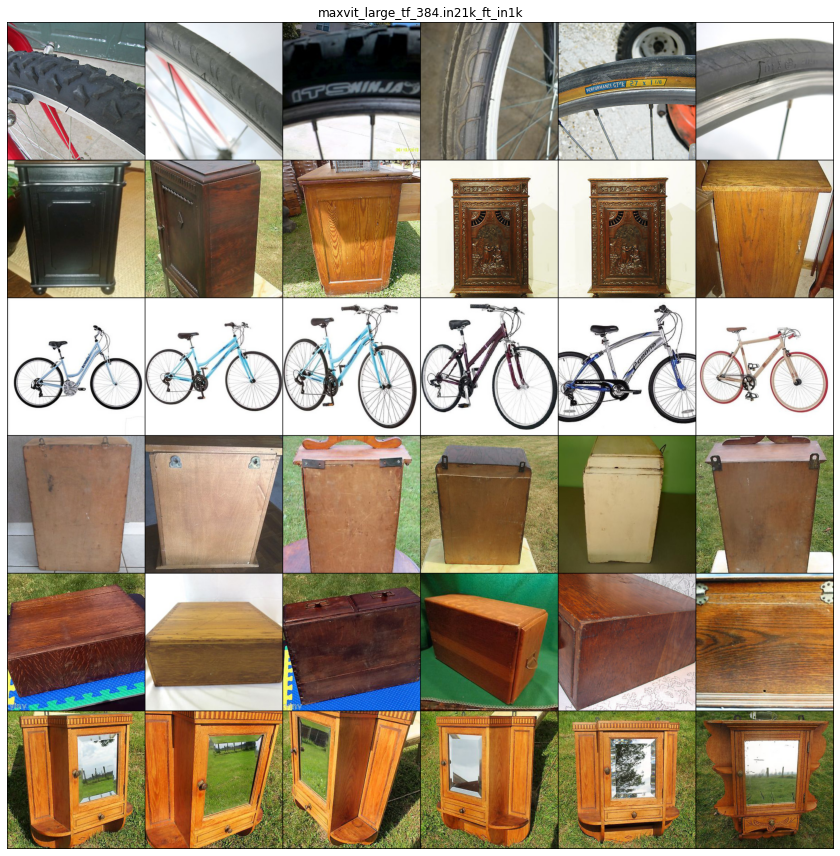

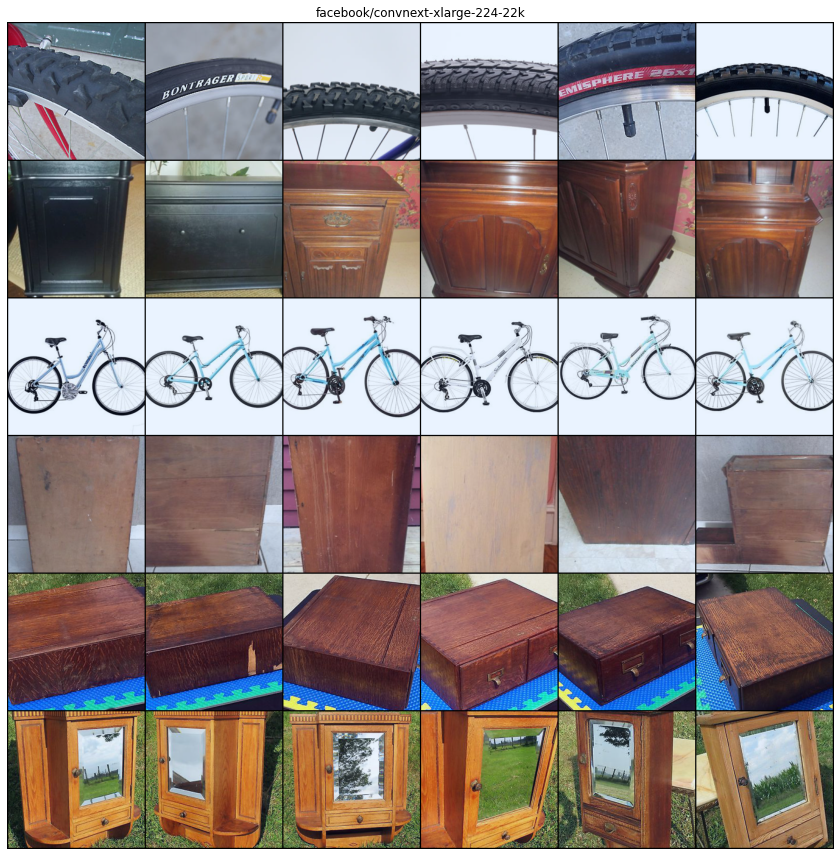

auto img_size: 224


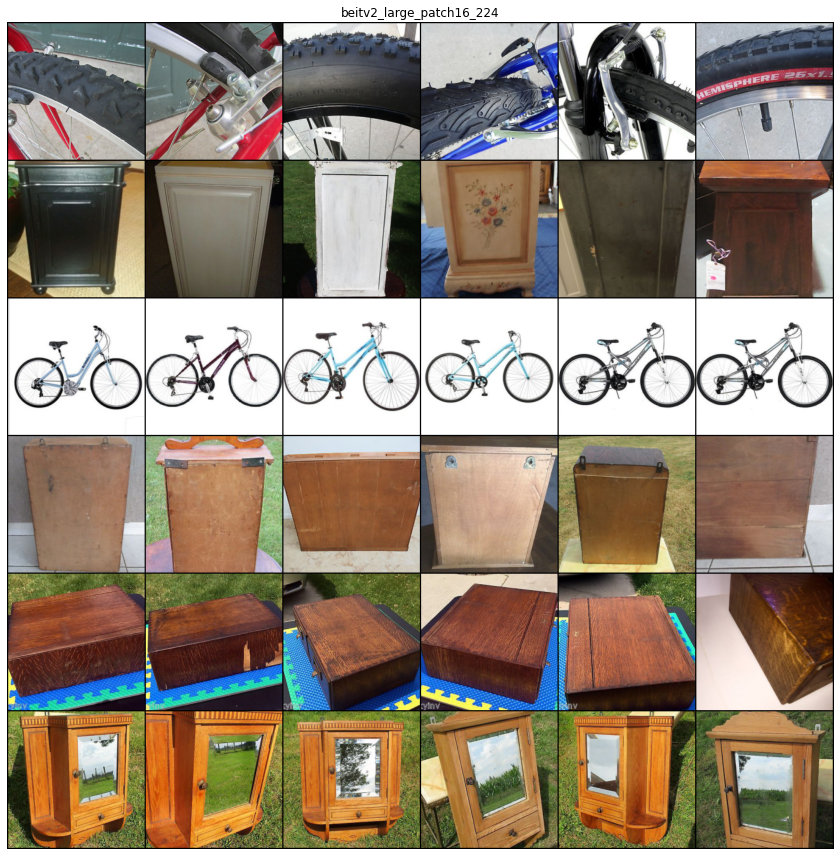

auto img_size: 224


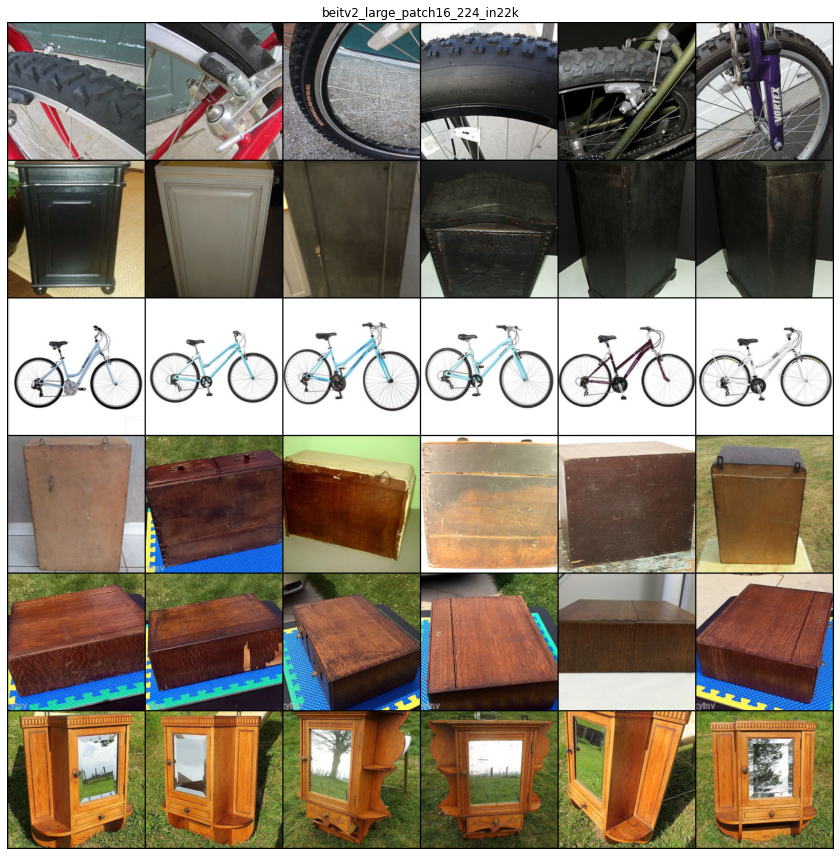

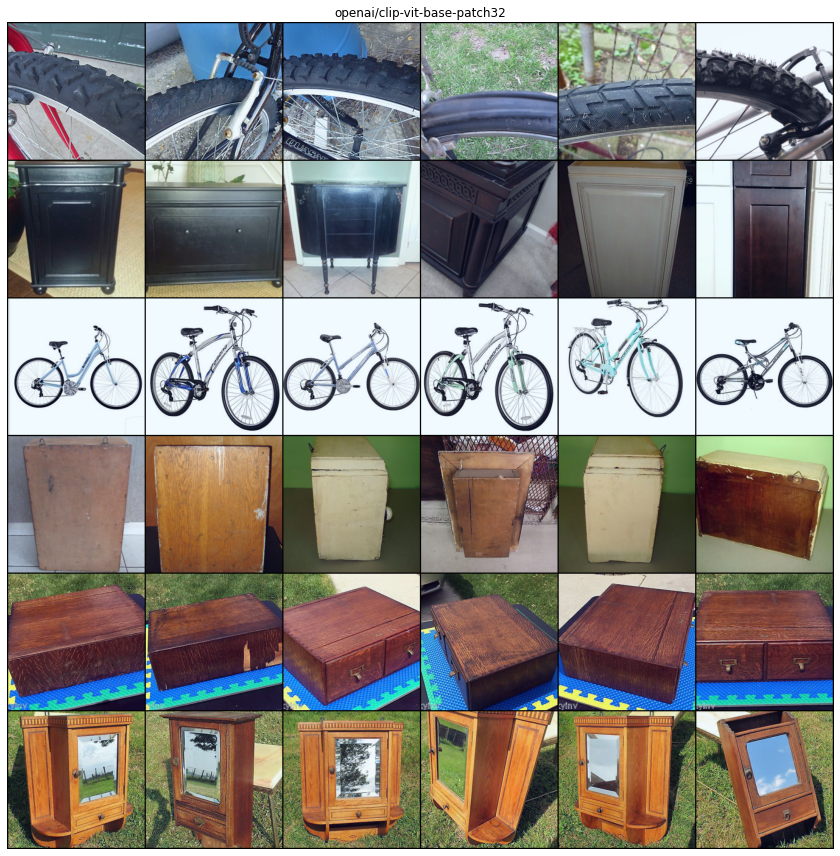

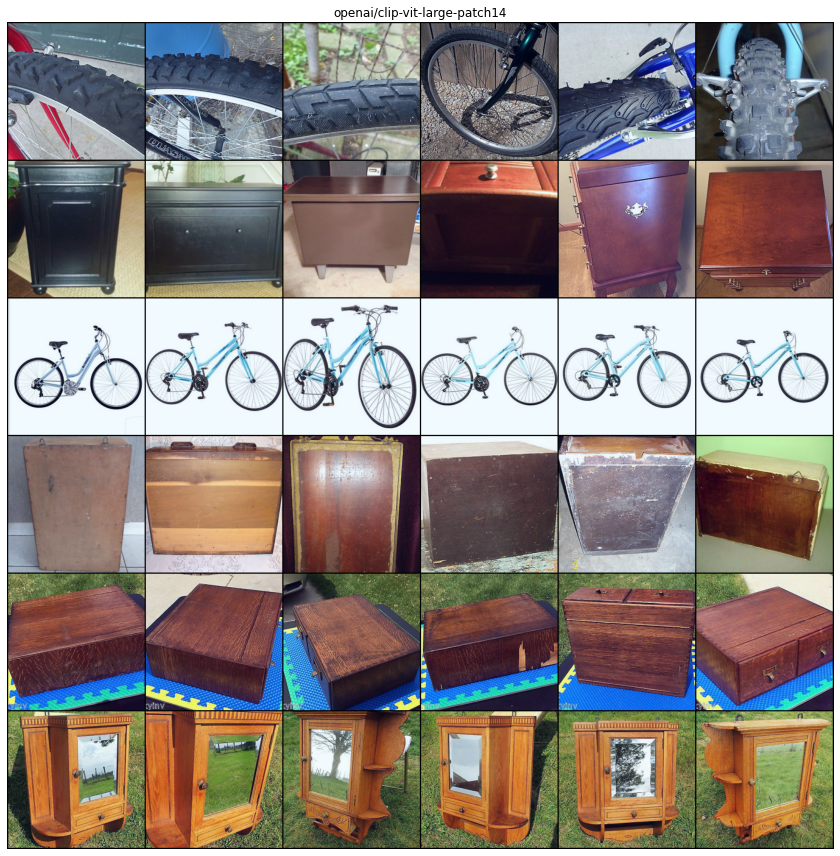

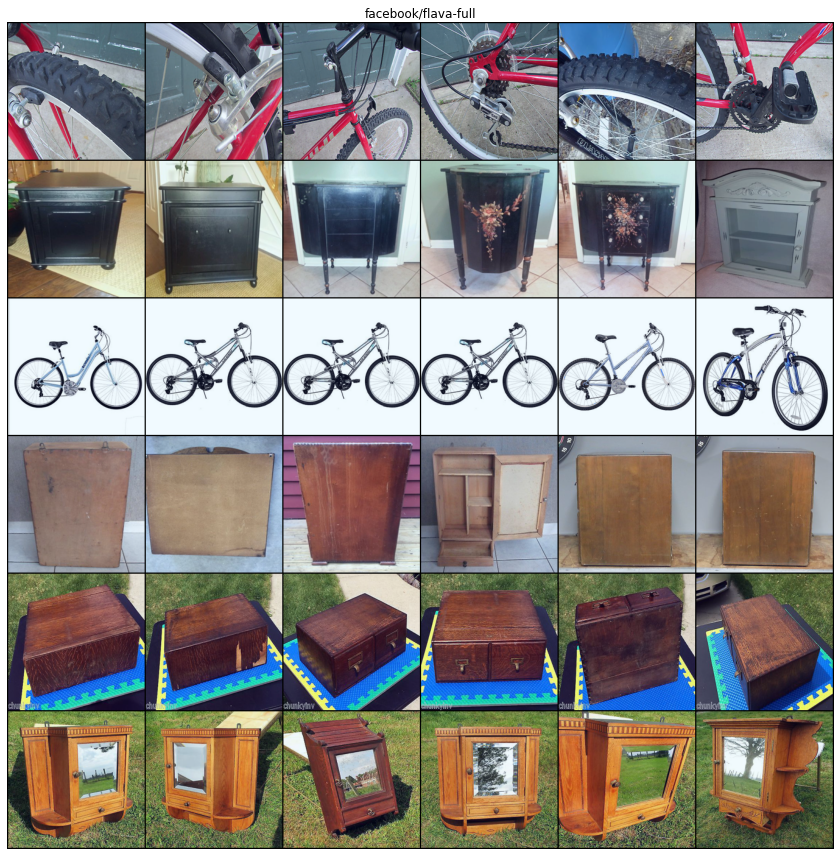

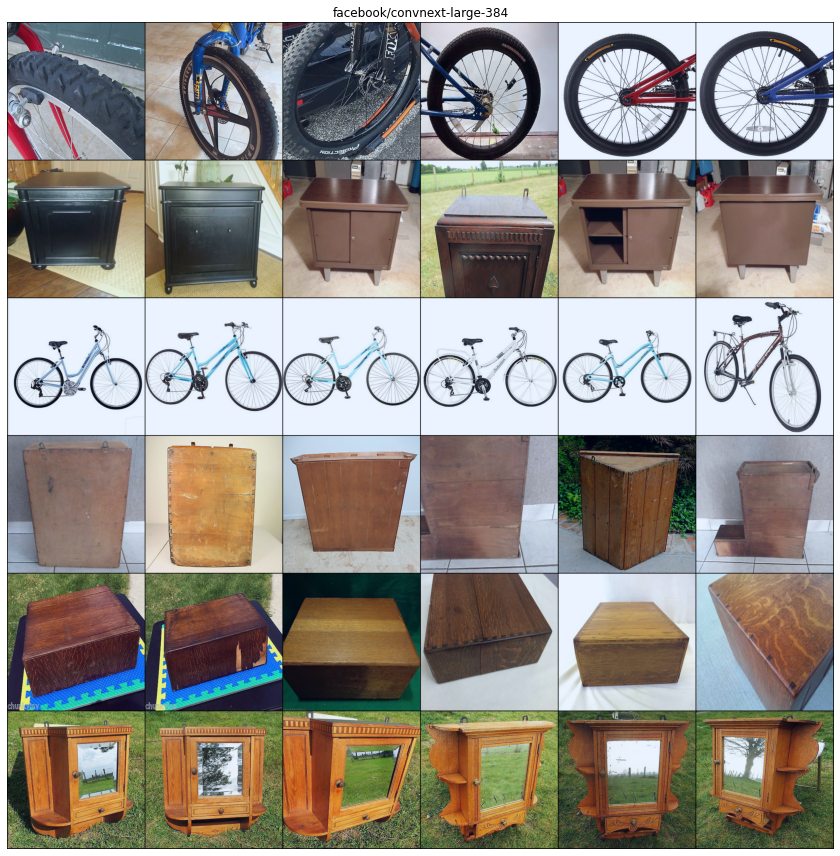

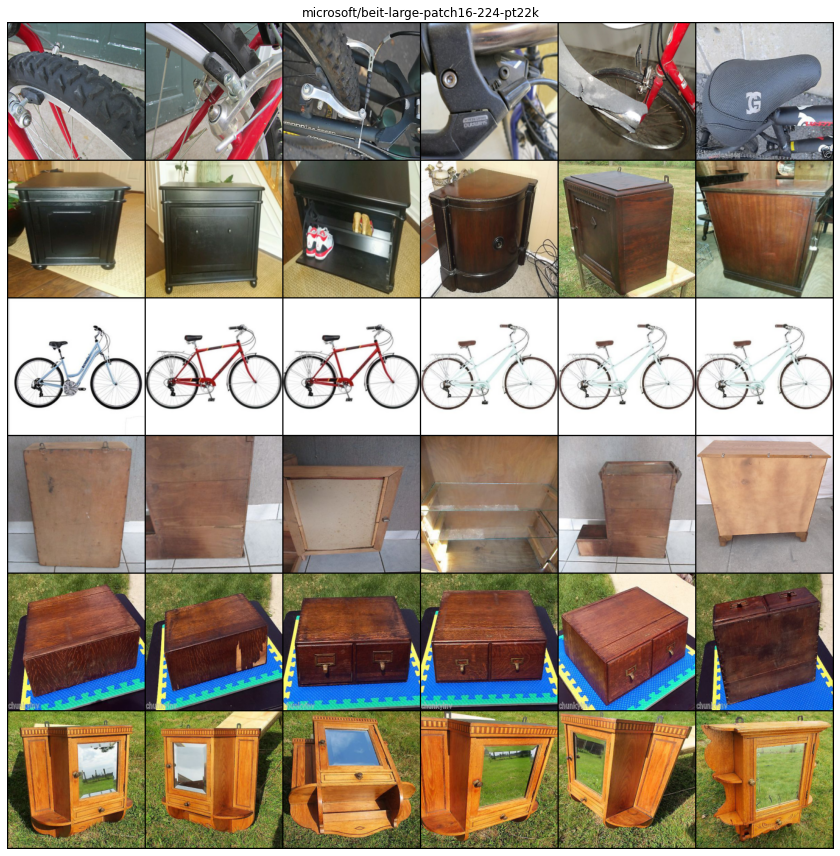

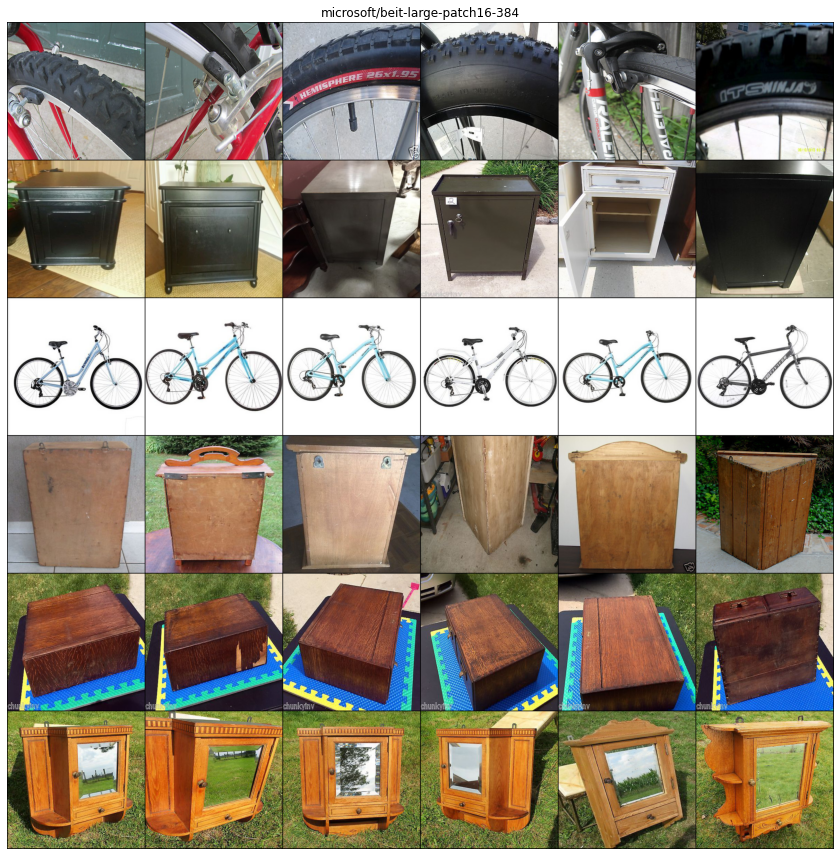

In [29]:
for model_name in model_names:
    show_query(model_name, '/kaggle/input/supervisely-embedder-data/stanford-products/stanford-products', 6, seed=3022)
    plt.show()

In [26]:
!mkdir out
!mv *.jpg out

mkdir: cannot create directory ‘out’: File exists


In [27]:
shutil.make_archive('out_rand','zip','out')

'/kaggle/working/out_rand.zip'

In [ ]:
features_save = model_names[2].replace('/','_')
features = torch.load(f'/kaggle/input/supervisely-embedder-data/stanford-products/{features_save}.pt', map_location='cpu')
features = features.numpy()

In [ ]:
decomp = umap.UMAP(7, min_dist=0.01)
features_proj = decomp.fit_transform(features)

In [ ]:
plt.figure(figsize=(12,9))
plt.scatter(features_proj[:,0], features_proj[:,1], s=10)

In [ ]:
from plotly import express as px

In [ ]:
px.scatter(x=features_proj[:,0], y=features_proj[:,1], hover_name=list(map(str,range(len(features)))))

In [ ]:
kdtree.query(features[[5718, 987]], 20)